## Work Flow of our project is as follows

1. Problem
* Identifying the breed of a dog given an image of a dog.

2. Data
* The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

3. Evaluation
* The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

4. Features
Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/Dog_Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog_Vision/" #run only once

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Dog_Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/Dog_Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/Dog_Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/Dog_Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/Dog_Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/Dog_Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/Dog_Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/Dog_Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/Dog_Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/drive/MyDrive/Dog_Vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/drive/M

# 1.Getting our workdlow ready.
* importing tensorflow version 2+
* importing tensorflow hub
* Using GPU (You need to change the runtime to access a GPU)

In [ ]:
#import tensorflow into colab and necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("Tensor flow version:",tf.__version__)
print("Tensorflow hub version:",hub.__version__)

#check for GPU availability
print("GPU", "Available" if tf.config.list_physical_devices('GPU') else "Not available ")

Tensor flow version: 2.18.0
Tensorflow hub version: 0.16.1
GPU Available


## tensors - fancy name for matrix ,tensors are compatible with GPU's
* Getting our data ready - Turning it into Tensor
* turning images into tensor(numerical representation)
* To explore shortcuts of google colab - `Ctrl + m + h`

In [ ]:
#checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/Dog_Vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
print(labels_csv.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
#calculating the total breed amount in labels.csv
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
brabancon_griffon,67
komondor,67


<Axes: xlabel='breed'>

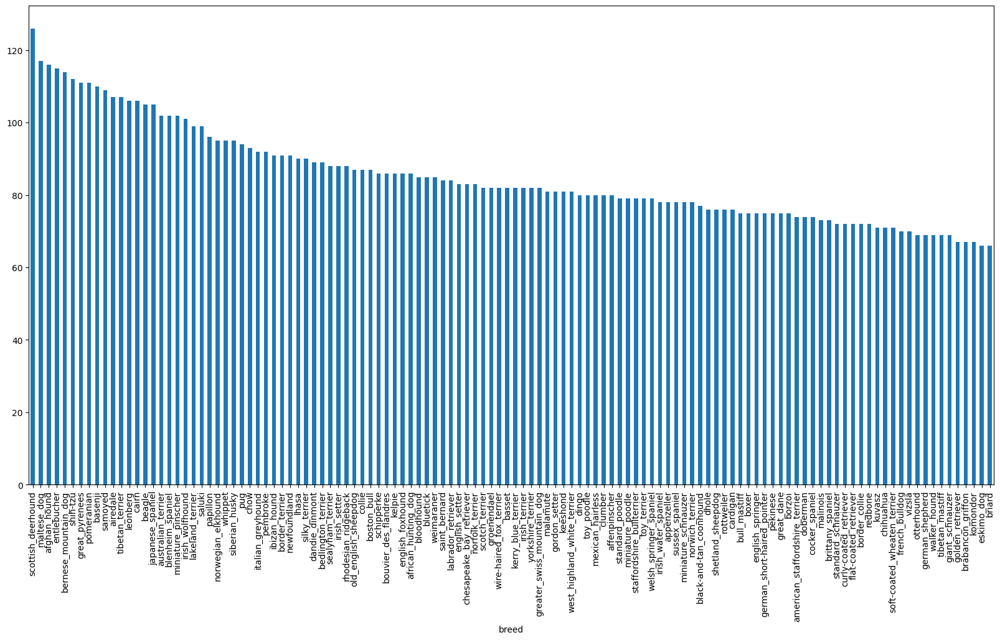

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

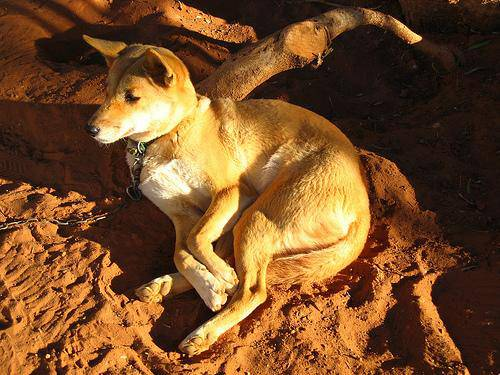

In [ ]:
#preparing the images

#viewing a image
from IPython.display import Image
#`Ctrl+Shift+space to open doc-string of a function`
Image("drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting Images and their labels
Lets get list of all of our iamge file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#create the path names for all the images using image id
filenames=["drive/MyDrive/Dog_Vision/train/"+fname+".jpg" for fname in labels_csv["id"]]

#check the first 10
filenames[:10]

['drive/MyDrive/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#checking if all paths are included or not
#m1
len(filenames) #to ensure it includes all image paths

10222

In [ ]:
#m2
import os
if len(os.listdir("drive/MyDrive/Dog_Vision/train/"))==len(filenames):
  print("Equal")

Equal


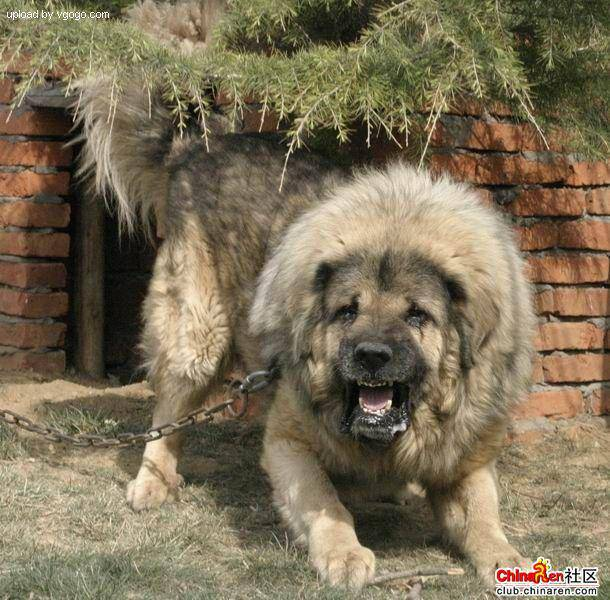

In [ ]:
#just randomly check an image - ensures data is properly stored
Image(filenames[9000])

Since we have got our training image filepaths in a list we will prepare our labels

In [ ]:
labels=labels_csv["breed"]  # `ctrl+ /` to add comment to each line starting
labels

,breed
0,boston_bull
1,dingo
2,pekinese
3,bluetick
4,golden_retriever
...,...
10217,borzoi
10218,dandie_dinmont
10219,airedale
10220,miniature_pinscher


In [ ]:
import numpy as np
labels=np.array(labels)
len(labels)

10222

In [ ]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

## checking for missing datas as its unstructured data we need to see all columns have equal value

In [ ]:
if len(labels)==len(filenames):
  print("No Missing Values")

No Missing Values


In [ ]:
#finding unique numpy arrays
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

## Turning labels into Array of booleans

In [ ]:
# trying to convert a single label first
print(labels[0])

boston_bull


In [ ]:
labels[0]==unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# applying this to all the labels
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#example turning boolean array into integers
print(labels[0]) # shows original name of label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Creating Our Own Validation Set

In [ ]:
#setting up the X and Y labels
X=filenames
y=boolean_labels

In [ ]:
# Note the data is quite large so its good to use slice of that data and see how things works on that
# set number of images to use in experimenting
NUM_IMAGES = 1000 # @param {"type":"slider","min":1000,"max":10000,"step":1000}

In [ ]:
#Splitting our data into train and validation sets
from sklearn.model_selection import train_test_split

#split data into train and validation of total side NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

## Preprocessing images (Turning images to tensors:)
to preprocess image we'll create a function which takes unput as file path and turn image to tensors and resize image to be in shape of (224,224) and the return the modified image

In [ ]:
 #importing an image
 #convert image to a numpy array
 from matplotlib.pyplot import imread
 image=imread(filenames[42])
 image.shape #(height,width,colour channel(0 to 255 has RGB colour value))

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
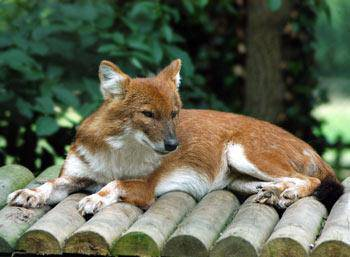

In [ ]:
image

In [ ]:
#turn simgle image to tensor
tf.constant(image) # gpu can proccess it

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Preprocessing Images (turning images into Tensors)
* To preprocess our images into Tensors we're going to write a function which does a few things:

* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable, image
* Turn our image (a jpg) into Tensors
* Normalize our image (convert color channel values from from 0-255 to 0-1).
* Resize the image to be a shape of (224, 224)
* Return the modified image

In [ ]:
#example case
tensor=tf.io.read_file(filenames[42])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
#define image size
IMG_SIZE=224

#create function to preprocess an image
def process_image(image_path,img_size=IMG_SIZE):
  """Takes up a image path and turns the image into a tensor"""
  #read an image file
  image=tf.io.read_file(image_path)
  #turn jpeg images into numerical tensor with 3 diff colour channels (rgb-red green blue)
  image=tf.image.decode_jpeg(image,channels=3) #values from 0 to 255
  #convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32) # values from 0 to 1
  #resize the image to (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image


Turning our data to batches
* process on whole data can be hectic, thus we use it in batches to find pattern and it heps in efficiency too in this case we use 32 batch size you can manually edit it too

In Order to use TensorFlow effectively, we need our data in the form of tensor tuples which looks like this:
`(iamge ,label)`.


In [ ]:
#creating a funtion to return tuple of tensors
def get_image_label(image_path,label):
  """Gives back pair of tensor tuple `(image,label)`"""
  image=process_image(image_path)
  return image,label

Turning a function to create all of our data X and Y into batches

In [ ]:
#define batch size, 32 is a good size
BATCH_SIZE=32

#Funtion to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Create batches of data from X and Y pairs
  Shuffles the data if training data but doesnt shuffle if its validation data
  also accepts test data as input (no labels)
  """
  # test dataset
  if test_data:
    print("Creating test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) # no labels, Only file paths
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #valid data set no need to shuffle it
  elif valid_data:
    print("Creating valid data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),  #filepath
                                             tf.constant(y))) #labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    #turn filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    #shuffle path names and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))
    #create (image,label) tuples(this also turns image path into preprocess image)
    data=data.map(get_image_label)
    #turn training data into batched
    data_batch=data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
#creating training and validation databatched
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)


Creating training data batches
Creating valid data batches


In [ ]:
#checking out different attributes of our databatches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Visualizing data batches
* Our data is now in batches however its a little hard to understand so lets visualize them using the below funtion

In [ ]:
import matplotlib.pyplot as plt
#creating a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  display a plot of 25 images and thier labels from a data batch
  """
  #set up figure
  plt.figure(figsize=(10,10))
  #loop through 25 (for displaying the images)
  for i in range(25):
    #create subplots (5 rows and 5 columns)
    ax=plt.subplot(5,5,i+1)
    #display an image
    plt.imshow(images[i])
    plt.axis("off")
    #title
    plt.title(unique_breeds[labels[i].argmax()])

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[8.12360644e-01, 8.39811623e-01, 9.41772401e-01],
          [7.28068411e-01, 7.47676313e-01, 8.65323365e-01],
          [5.04768431e-01, 5.19509315e-01, 6.15972936e-01],
          ...,
          [5.46024442e-01, 5.65632343e-01, 6.80742383e-01],
          [5.91367900e-01, 6.13620222e-01, 7.18678713e-01],
          [5.23389101e-01, 5.46918511e-01, 6.47024095e-01]],
 
         [[8.26186776e-01, 8.53637755e-01, 9.55598533e-01],
          [7.76546299e-01, 7.96154141e-01, 9.13296342e-01],
          [5.78848064e-01, 5.93588948e-01, 6.90052569e-01],
          ...,
          [4.69222844e-01, 4.92752254e-01, 5.81407666e-01],
          [5.29385746e-01, 5.56241512e-01, 6.33546770e-01],
          [5.04199743e-01, 5.31055450e-01, 6.08084381e-01]],
 
         [[9.00881708e-01, 9.32254255e-01, 1.00000000e+00],
          [7.80672371e-01, 8.00875425e-01, 9.12815213e-01],
          [5.30096412e-01, 5.44811964e-01, 6.48879468e-01],
          ...,
          [4.08638865e-01, 4.31538016e-01, 4.8549

In [ ]:
len(train_images),len(train_labels)

(32, 32)

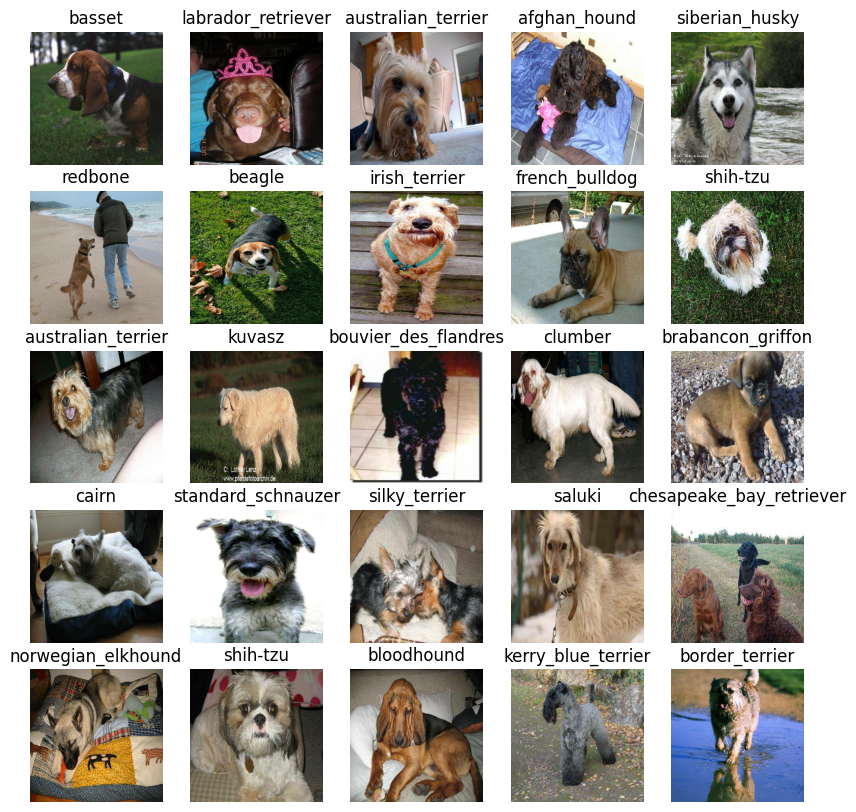

In [ ]:
#visualize the data in the training batch
show_25_images(train_images,train_labels)

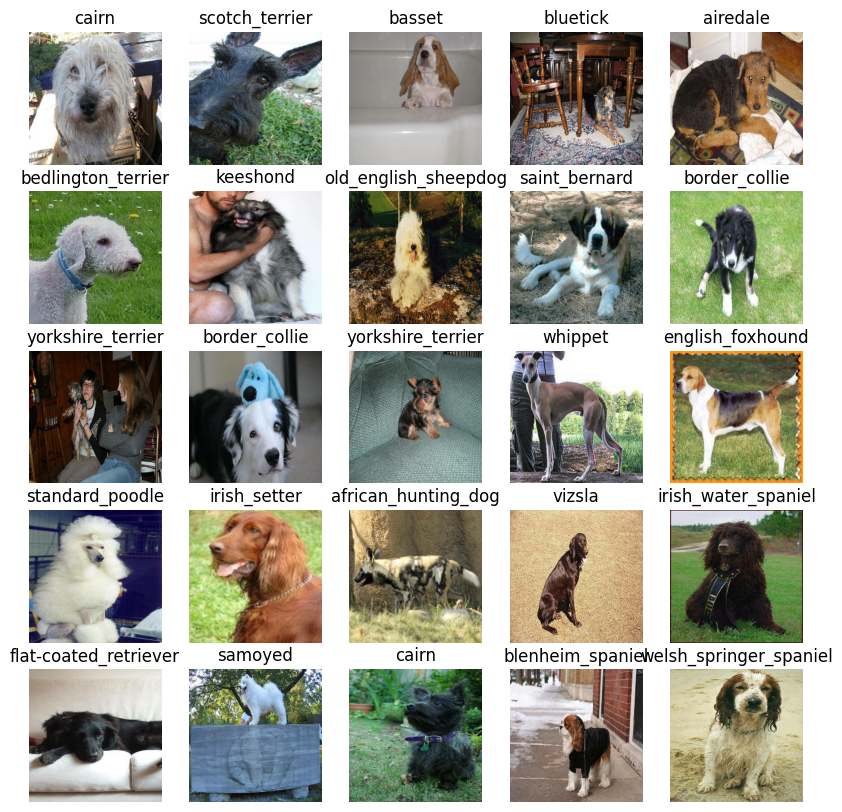

In [ ]:
#now visualizing our validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

# 2.building a model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

import kagglehub

# Download latest version
path = kagglehub.model_download("google/mobilenet-v2/tensorFlow2/035-128-classification")

print("Path to model files:", path)

# Setup model URL from TensorFlow Hub
MODEL_URL ="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


  0%|          | 0.00/5.08k [00:00<?, ?B/s]

100%|██████████| 5.08k/5.08k [00:00<00:00, 6.58MB/s]

100%|██████████| 1.25M/1.25M [00:00<00:00, 22.5MB/s]



  0%|          | 0.00/6.49M [00:00<?, ?B/s]
100%|██████████| 6.49M/6.49M [00:00<00:00, 48.0MB/s]

Path to model files: /root/.cache/kagglehub/models/google/mobilenet-v2/tensorFlow2/035-128-classification/2


Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
!pip install --upgrade tensorflow tensorflow-hub
!pip install keras

In [ ]:
!pip install tf_keras

In [ ]:
import tf_keras
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer=tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
* Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

* We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

TensorBoard Callback: To setup a TensorBoard callback, we need to do 3 things:
* Load the TensorBoard notebook extension ✅
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
* Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
#load tensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  #create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/MyDrive/Dog_Vision/logs",
                      #make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

## Early Stoping Callback

It preventing overfitting by stopping training if a certian evaluation metric is not improving (helps in generalizing the model)

In [ ]:
#create early stopping callback
early_stopping=tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

# 3.Tranning a Model

* We'll train only on the subsets, Our first model will be trained only on the first 1000 images to make sure everything is working.

  1. Using `NUM-EPOCH=100`
  2. If model guess `quite worse` means higher the `loss`.

In [ ]:
NUM_EPOCH = 100 # @param {"type":"slider","min":100,"max":1000,"step":10}

In [ ]:
#cheking gpu
print("GPU","Available" if tf.config.list_physical_devices("GPU") else "Not Available")
#if gpu available then increase NUM_EPOCH to 100 else decrese to 10

GPU Available


## Creating Funstions to train model
* create a model using `create_model()`
* setup a tensorboard calback using `create_tensorboard_callback`
* call the `fit()` function on our model passing it the training data, validation data, np. of epoch to train for and callback functions
* return the model

In [ ]:
#build a function to train and return a model
def train_model():
  """
  Trains a given model and train  it and returns the trained model
  """
  #create a model
  model=create_model()

  #create new tensorboard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  #fit the model to the data passing it the call backs we created
  model.fit(x=train_data,
            epochs=NUM_EPOCH,
            validation_data=val_data,
            validation_freq=1,# how often we want to find the patterns per epoch
            callbacks=[tensorboard,early_stopping])

  return model


In [ ]:
#fit the model to the data
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 14s 205ms/step - loss: 4.5785 - accuracy: 0.0925 - val_loss: 3.4518 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 6s 225ms/step - loss: 1.6374 - accuracy: 0.6900 - val_loss: 2.1545 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 4s 148ms/step - loss: 0.5647 - accuracy: 0.9350 - val_loss: 1.6579 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 5s 194ms/step - loss: 0.2528 - accuracy: 0.9900 - val_loss: 1.4685 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 167ms/step - loss: 0.1454 - accuracy: 0.9987 - val_loss: 1.4029 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 5s 181ms/step - loss: 0.0999 - accuracy: 1.0000 - val_loss: 1.3568 - val_accuracy: 0.6650
Epoch 7/100
25/25 [=============================

## Checking the tensorboard logs
the tensorboard magic funtion (%tensorboard)will access the logs directory we created earlier and visalize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog_Vision/logs

<IPython.core.display.Javascript object>

# 4.Making and evaluating prediction using a trained model


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#making predictions on the validation data (not used for training on)
predictions=model.predict(val_data,verbose=1)

7/7 [==============================] - 2s 161ms/step


In [ ]:
predictions

array([[1.6696451e-03, 6.4404230e-05, 2.6060280e-03, ..., 1.0010048e-04,
        3.5570956e-05, 2.1767017e-02],
       [1.9337378e-03, 1.1672172e-04, 5.4912507e-03, ..., 9.2484622e-04,
        1.9619502e-02, 1.6392038e-04],
       [5.9755848e-06, 2.0038595e-05, 1.4266548e-05, ..., 5.5480556e-04,
        1.2987411e-05, 4.5373902e-04],
       ...,
       [1.8888237e-05, 2.5739192e-04, 1.8323255e-04, ..., 7.9496103e-06,
        7.2726158e-05, 4.4093194e-05],
       [9.3364576e-04, 1.2881102e-04, 3.2704155e-04, ..., 5.6789097e-05,
        2.1299113e-04, 1.0233557e-02],
       [2.7530873e-04, 1.1340555e-04, 9.5225399e-04, ..., 3.2027035e-03,
        6.9214753e-04, 2.8008514e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val),len(unique_breeds)

(200, 120)

In [ ]:
#Predicitons
index=42
print(predictions[index])
print(f"Max Value (Probability of prediction) :{np.max(predictions[index])}")
print(f"Sum :{np.sum(predictions[index])}")
print(f"Max Index :{np.argmax(predictions[index])}")
print(f"Predicted Label :{unique_breeds[np.argmax(predictions[index])]}")

[1.48771171e-04 9.20965103e-05 6.23365413e-05 1.47952569e-05
 4.50852048e-03 8.34444654e-05 1.45960206e-04 1.12487189e-03
 2.18041204e-02 3.58025506e-02 5.70917728e-05 2.31979611e-05
 4.05255181e-04 2.96168448e-03 8.64031259e-04 1.53737818e-03
 8.24981107e-05 1.17258263e-04 8.56498227e-05 7.24673228e-05
 1.44947098e-05 1.17937895e-03 4.36190057e-05 1.26334471e-05
 4.87994310e-03 5.77629326e-05 4.31218505e-05 6.82152386e-05
 4.25895632e-05 5.95466445e-05 2.40919890e-05 5.02663024e-05
 1.89004189e-04 1.47984611e-05 2.08402180e-05 8.83375469e-05
 1.53656249e-04 5.62808767e-04 1.99122645e-04 4.15040672e-01
 2.44828552e-04 1.86603775e-05 3.97372898e-03 1.64117864e-05
 2.86602066e-04 7.87978752e-06 5.71737764e-04 1.13883332e-04
 5.16838300e-05 4.84638556e-04 1.56848604e-04 8.56276092e-05
 3.05088644e-04 1.47479959e-03 1.36271710e-05 3.02237138e-04
 8.29174591e-04 1.51357279e-04 3.24474349e-05 2.17395955e-05
 3.79753983e-05 2.12344923e-03 2.34383042e-05 3.62956562e-05
 1.37280076e-04 8.530997

### Prediction probability are also called as confidence level

In [ ]:
#turn the probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns array of prediction probabilities into a lable
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

#get a predicted label based on array of prediction probabilities
pred_label=get_pred_label(predictions[0])
pred_label

'cairn'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a function to unbatch a batch dataset
def unbatchify(data):
  """
  takes a batch dataset of (image,label) tensors and returns seperate arrays of images and labels
  """
  images=[]
  labels=[]
  #loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels


#unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

# 5.Visualizing And Evaluate predictions

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images
Let's make some function to make these all a bit more visaulize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

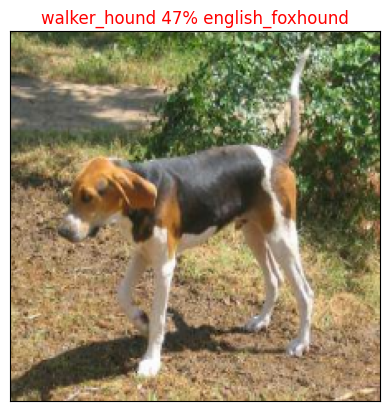

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

### Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
    * Prediction probabilities indexes ✅
    * Prediction probabilities values ✅
    * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

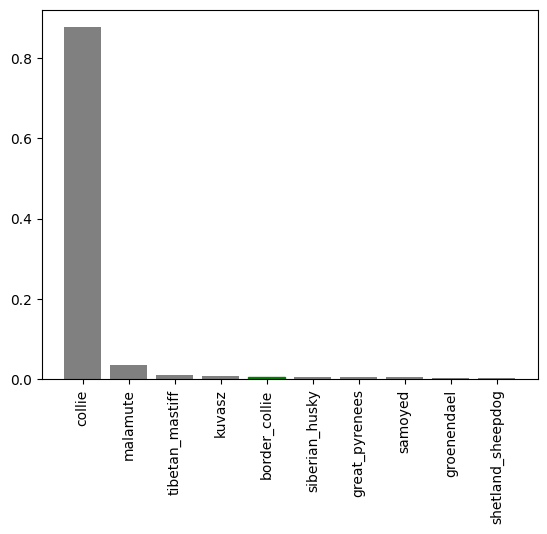

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

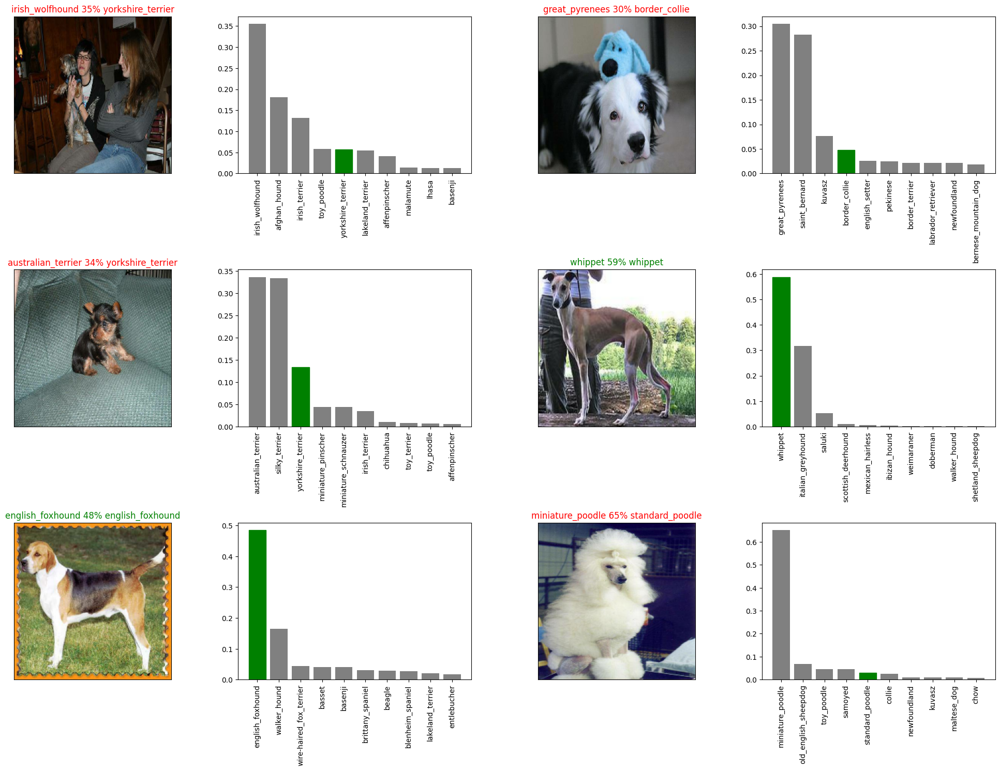

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# 6.Save and reloading a model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog_Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog_Vision/models/20250308-09061741424766-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog_Vision/models/20250308-09061741424766-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog_Vision/models/20250308-09061741424766-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog_Vision/models/20250308-09061741424766-1000-images-mobilenetv2-Adam.h5


In [ ]:
#evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 105ms/step - loss: 1.2532 - accuracy: 0.6650


[1.2531547546386719, 0.6650000214576721]

In [ ]:
#evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 127ms/step - loss: 1.2532 - accuracy: 0.6650


[1.2531547546386719, 0.6650000214576721]

# 7.Training on the entire dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCH,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 47s 133ms/step - loss: 1.3673 - accuracy: 0.6649
Epoch 2/100
320/320 [==============================] - 42s 130ms/step - loss: 0.4082 - accuracy: 0.8790
Epoch 3/100
320/320 [==============================] - 42s 130ms/step - loss: 0.2441 - accuracy: 0.9338
Epoch 4/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1536 - accuracy: 0.9658
Epoch 5/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1077 - accuracy: 0.9766
Epoch 6/100
320/320 [==============================] - 53s 166ms/step - loss: 0.0791 - accuracy: 0.9861
Epoch 7/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0583 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0465 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 44s 139ms/step - loss: 0.0386 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 44s 137m

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-adam")

Saving model to: drive/MyDrive/Dog_Vision/models/20250308-09391741426776-full-image-set-mobilenetv2-adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog_Vision/models/20250308-09391741426776-full-image-set-mobilenetv2-adam.h5'

In [ ]:
#load the full model
loaded_full_model=load_model("/content/drive/MyDrive/Dog_Vision/models/20250308-09391741426776-full-image-set-mobilenetv2-adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog_Vision/models/20250308-09391741426776-full-image-set-mobilenetv2-adam.h5


# 8.Making Predictions on the test dataset:

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.
<br><br>
Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.
<br><br>
To make predictions on the test data, we'll:
<br>
* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to True (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
#load the test image filenames
test_path="/content/drive/MyDrive/Dog_Vision/test/"
test_filenames=[test_path +fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog_Vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#make predictions on the test data using the loaded full model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 43s 131ms/step


In [ ]:
#save predictions (Numpy array)to csv file (for later access)
np.savetxt("drive/MyDrive/Dog_Vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
#load predictions (Numpy array) from csv file
test_predictions=np.loadtxt("/content/drive/MyDrive/Dog_Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[8.94891192e-12, 1.94065059e-11, 6.87157300e-15, ...,
        1.98701343e-14, 3.76873949e-11, 4.28994687e-11],
       [3.53317864e-06, 1.00414320e-06, 1.60226588e-08, ...,
        2.26671477e-11, 1.64532210e-07, 2.47304982e-10],
       [3.24195683e-12, 3.27102576e-08, 8.14257994e-10, ...,
        3.81694427e-08, 7.55364629e-13, 2.54244824e-12],
       ...,
       [3.59493102e-10, 2.06322511e-11, 2.44172443e-11, ...,
        1.03560518e-13, 7.58783227e-13, 8.03081646e-12],
       [2.97571603e-12, 1.19218080e-10, 7.07581632e-11, ...,
        7.83088637e-07, 3.57018914e-10, 7.60361392e-12],
       [5.82091320e-10, 1.48406374e-11, 5.16792859e-12, ...,
        5.49043124e-13, 7.30542710e-12, 3.01486907e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

# 9.Preparing the dataset in the particular format
## Using `ID` we have to show all predicted possibilities for `120 Dog Breeds`

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
#create pandas dataframe with empty columns
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
#append test image ids to predictions dataframe
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#add the predictions probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,8.948912e-12,1.940651e-11,6.871573e-15,6.076279e-14,1.650362e-13,4.712364e-12,2.250977e-17,3.045043e-13,3.306622e-14,...,1.352086e-12,3.468988e-14,9.103256e-14,8.890267e-16,7.885062e-15,2.707161e-13,2.495671e-13,1.987013e-14,3.768739e-11,4.289947e-11
1,00102ee9d8eb90812350685311fe5890,3.533179e-06,1.004143e-06,1.602266e-08,4.476401e-09,1.725853e-06,3.898864e-09,2.205018e-06,3.669937e-07,1.751617e-08,...,5.039801e-09,3.915449e-07,3.189105e-09,7.239262e-06,7.375893e-08,3.195517e-07,4.527317e-04,2.266715e-11,1.645322e-07,2.473050e-10
2,0012a730dfa437f5f3613fb75efcd4ce,3.241957e-12,3.271026e-08,8.142580e-10,3.309085e-12,4.370986e-11,5.698060e-10,1.783137e-12,4.109322e-13,7.653362e-10,...,1.906494e-13,6.701165e-13,4.478616e-09,8.977183e-08,4.860351e-09,8.158888e-10,5.293871e-14,3.816944e-08,7.553646e-13,2.542448e-12
3,001510bc8570bbeee98c8d80c8a95ec1,2.665245e-07,1.523021e-07,3.105326e-08,8.269680e-06,1.801095e-05,3.746932e-06,1.024929e-11,6.128455e-10,4.226092e-08,...,2.748125e-08,5.139358e-11,2.547436e-06,7.876175e-11,1.517649e-07,2.479683e-10,1.447332e-15,1.460999e-03,1.502989e-10,4.610687e-08
4,001a5f3114548acdefa3d4da05474c2e,2.218677e-05,1.593636e-06,5.161846e-09,1.575171e-10,1.020655e-09,4.393053e-12,6.819351e-11,2.716488e-09,5.479100e-09,...,1.598923e-08,1.587755e-11,7.517051e-12,5.523856e-12,7.058334e-11,2.907669e-10,6.369000e-12,2.955268e-09,7.197671e-11,8.437036e-09


In [ ]:
#save our predictions dataframe to csv
preds_df.to_csv("drive/MyDrive/Dog_Vision/full-model-predictions-submission-1-mobilenetv2.csv",index=False)

# 10.Making Prediction on Custom Images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [141]:
#get image file path
custom_path="/content/drive/MyDrive/Dog_Vision/custom_images/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]

In [142]:
custom_image_paths

['/content/drive/MyDrive/Dog_Vision/custom_images/3.jpeg',
 '/content/drive/MyDrive/Dog_Vision/custom_images/2.jpeg',
 '/content/drive/MyDrive/Dog_Vision/custom_images/1.jpeg']

In [143]:
#turn custom image to data batches
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [144]:
#make predictions on the custom data
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 457ms/step


In [145]:
custom_preds

array([[2.71640163e-14, 5.38946361e-12, 3.92739227e-14, 5.54006050e-15,
        1.30383371e-10, 1.34170279e-11, 9.10550368e-12, 9.84961609e-17,
        3.62086527e-14, 1.46819622e-12, 1.52437081e-14, 4.93126116e-14,
        6.73946510e-10, 1.90936086e-11, 2.72464451e-12, 3.76768200e-11,
        6.55954566e-13, 1.36280561e-11, 3.65549084e-11, 5.12125691e-15,
        2.23476192e-14, 2.76837446e-16, 3.04662098e-14, 1.35704809e-10,
        1.91600247e-09, 2.95522357e-11, 2.80785811e-13, 9.02595815e-13,
        3.84224563e-09, 6.93035256e-12, 9.12515709e-14, 2.48411829e-11,
        8.46548165e-09, 3.83750358e-11, 1.04811049e-12, 7.97156958e-12,
        1.01527901e-11, 1.00507302e-11, 2.33028166e-15, 1.82504480e-11,
        1.45833328e-08, 3.54174415e-12, 8.06866379e-11, 3.17786444e-12,
        1.70273822e-08, 6.38716781e-13, 3.69456679e-12, 3.87223568e-15,
        8.49707804e-12, 9.99999881e-01, 1.08735012e-08, 1.03292333e-10,
        2.56621582e-11, 2.80035484e-09, 1.53246336e-14, 8.455192

In [146]:
custom_preds.shape

(3, 120)

In [147]:
#get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'maltese_dog', 'golden_retriever']

In [148]:
# get custom images (our unbatchify() function wont work since it doesnt have labels)
custom_images=[]
#loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


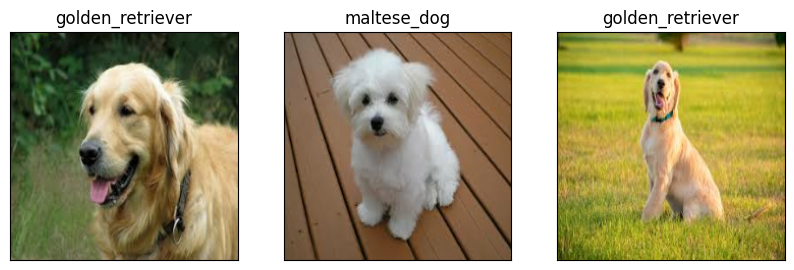

In [149]:
#check custom image prediction
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)